<a href="https://colab.research.google.com/github/shubhamSonarghare/Imagenette-Lite/blob/master/Imagenette-Lite.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Setting Up the Colab Notebook

## Mounting Drive

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


## Loading Tensorflow 2.0 in Colab

In [0]:
%tensorflow_version 2.x
%load_ext tensorboard

## Unzipping the Dataset from My drive

In [0]:
!unzip -qq "/content/drive/My Drive/SHARED_EE544 /assignment/imagenette_6class.zip" ;

In [0]:
!unzip -qq "/content/drive/My Drive/imagenette_6class.zip" 

## Importing the Required libraries

In [0]:
import tensorflow as tf
import tensorflow_addons as tfa
#from tensorflow.keras.layers import Conv2D,MaxPool2D, Flatten, Dense
print(tf.__version__)
from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt
import glob, os
import datetime
import time
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
plt.style.use('default')
plt.rcParams["figure.figsize"] = (20,7)

2.2.0-rc2


## Setting Up Train, test & Validation directories

In [0]:
train_dir = "/content/train/"
test_dir = "/content/test/"
valid_dir = "/content/validation/"

## Keras Data Generator

In [0]:
CLASS_NAMES = os.listdir(train_dir)

##################### with Single image generator training time was ############ 
##################### affecting somehow. Don't know the reason. ################

train_image_generator = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)
valid_image_generator = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)
test_image_generator = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)


BATCH_SIZE = 32
IMG_HEIGHT = 224
IMG_WIDTH = 224
#STEPS_PER_EPOCH = np.ceil(image_count/BATCH_SIZE)

train_data_gen = train_image_generator.flow_from_directory(directory=train_dir,
                                                     batch_size=BATCH_SIZE,
                                                     shuffle=True,
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                     seed=2)
valid_data_gen = valid_image_generator.flow_from_directory(directory=valid_dir,
                                                     batch_size=BATCH_SIZE,
                                                     shuffle=False,
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                     seed=2)

test_data_gen = test_image_generator.flow_from_directory(directory=test_dir,
                                                     batch_size=BATCH_SIZE,
                                                     shuffle=False,
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                     seed=2)


Found 7200 images belonging to 6 classes.
Found 600 images belonging to 6 classes.
Found 300 images belonging to 6 classes.


## Commands to save files

In [0]:
#save logs 
#!rm -rf "/content/drive/My Drive/My_EE544/logs"
#!rm -rf base*

!cp logs -r "/content/drive/My Drive/My_EE544/"
!cp base_* -r "/content/drive/My Drive/My_EE544/"
!cp model_* -r "/content/drive/My Drive/My_EE544/"

cp: cannot stat 'base_*': No such file or directory


In [0]:
!cp -r "/content/drive/My Drive/My_EE544/logs" "/content/" 
#!cp -r "/content/drive/My Drive/My_EE544/base_"* "/content/"

In [0]:
!cp -r *.h5 "/content/drive/My Drive/My_EE544/h5_Models/"

In [0]:
!rm -rf *.h5

In [0]:
!cp "/content/drive/My Drive/My_EE544/h5_Models/"*.h5 /content/

# Training

## Supporting funtions

In [0]:
def create_model(num_of_classes, positions=[], layers=[]):
    ####### kernel initialization = 'glorot_uniform' & dilation_rate=1 is default in Keras hence not explicitly mentioned #############
    model_layer=[tf.keras.layers.Conv2D(32,(3,3),padding='same', activation='relu', input_shape=(224,224,3)),
                 tf.keras.layers.Conv2D(32,(3,3),padding='same', activation='relu'),
                 tf.keras.layers.MaxPool2D(pool_size=(2,2)),
                 tf.keras.layers.Conv2D(64,(3,3),padding='same', activation='relu'),
                 tf.keras.layers.Conv2D(64,(3,3),padding='same', activation='relu'),
                 tf.keras.layers.MaxPool2D(pool_size=(2,2)),
                 tf.keras.layers.Flatten(),
                 tf.keras.layers.Dense(512, activation='relu'), 
                 tf.keras.layers.Dense(num_of_classes,activation='softmax')]
    
    cnt=0
    for i in range(len(positions)):
      model_layer.insert(positions[i]+cnt, layers[i])
      cnt+=1
    
    model = tf.keras.models.Sequential(model_layer)
    '''model.compile(optimizer='adam', 
              loss='categorical_crossentropy', 
              metrics=['accuracy'])'''
    
    return model

def create_model_2(num_of_classes, positions=[], layers=[]):
    
    model_layer=[tf.keras.layers.Conv2D(32,(3,3),padding='same', input_shape=(224,224,3)),
                 tf.keras.layers.Activation('relu'),
                 tf.keras.layers.Conv2D(32,(3,3),padding='same'),
                 tf.keras.layers.Activation('relu'),
                 tf.keras.layers.MaxPool2D(pool_size=(2,2)),
                 tf.keras.layers.Conv2D(64,(3,3),padding='same'),
                 tf.keras.layers.Activation('relu'),
                 tf.keras.layers.Conv2D(64,(3,3),padding='same'),
                 tf.keras.layers.Activation('relu'),
                 tf.keras.layers.MaxPool2D(pool_size=(2,2)),
                 tf.keras.layers.Flatten(),
                 tf.keras.layers.Dense(512),
                 tf.keras.layers.Activation('relu'), 
                 tf.keras.layers.Dense(num_of_classes,activation='softmax')]
    
    cnt=0
    for i in range(len(positions)):
      model_layer.insert(positions[i]+cnt, layers[i])
      cnt+=1
    
    model = tf.keras.models.Sequential(model_layer)
    '''model.compile(optimizer='adam', 
              loss='categorical_crossentropy', 
              metrics=['accuracy'])'''
    
    return model

def add_callback(dir_name,log, tfcallback = True, saveModel=True):
  tensorboard_callback = None
  cp_callback = None
  if tfcallback==True:
    #logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
    logdir = os.path.join("logs",log);
    tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)
  if saveModel==True:
    checkpoint_path = "/content/"+dir_name+"/model_1.ckpt"
    checkpoint_dir = os.path.dirname(checkpoint_path)
    cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,save_weights_only=True,verbose=1, save_best_only=True, monitor='val_accuracy')

  return tensorboard_callback, cp_callback

def build_model(model, model_optimizer,model_metric='accuracy', model_loss='categorical_crossentropy'):
  model.compile(optimizer=model_optimizer, 
              loss=model_loss, 
              metrics=[model_metric, ])

def train_model(train_ds, valid_ds, model, num_epochs, batch_size, tf_c, save_c):
    return model.fit(train_ds, epochs=num_epochs, steps_per_epoch=7200/batch_size, validation_data=valid_ds, validation_steps=600/batch_size , callbacks=[tf_c, save_c])

def visualize(history, epochs):
  fig = plt.figure()
  
  plt.subplot(1,2,1)
  plt.plot(history.history['accuracy']);
  plt.plot(history.history['val_accuracy'])
  plt.title("Model Accuracy")
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  label_a = "{:.2f}".format(history.history['accuracy'][-1])
  label_b = "{:.2f}".format(history.history['val_accuracy'][-1])
  plt.annotate(label_a, (epochs-1,history.history['accuracy'][-1]), textcoords="offset points", 
               xytext=(0,10),ha='center')
  plt.annotate(label_b, (epochs-1,history.history['val_accuracy'][-1]), textcoords="offset points", 
               xytext=(0,10),ha='center')
  plt.legend(['train', 'Validation'], loc='upper left')

  plt.subplot(1,2,2)
  plt.plot(history.history['loss']);
  plt.plot(history.history['val_loss'])
  plt.title("Model Loss")
  plt.ylabel('loss')
  plt.xlabel('epoch')
  label_c = "{:.2f}".format(history.history['loss'][-1])
  label_d = "{:.2f}".format(history.history['val_loss'][-1])
  plt.annotate(label_c, (epochs-1,history.history['loss'][-1]), textcoords="offset points", 
               xytext=(0,10),ha='center')
  plt.annotate(label_d, (epochs-1,history.history['val_loss'][-1]), textcoords="offset points", 
               xytext=(0,10),ha='center')
  plt.legend(['train', 'Validation'], loc='upper left')

  plt.show()




In [0]:
def save_model(n_classes,chk_pt_name, model_optimizer,name=''):
    save_model = create_model(n_classes);
    build_model(save_model, model_optimizer=model_optimizer);
    save_model.load_weights(chk_pt_name);
    #loss, acc = save_model.evaluate(valid_data_gen, steps=steps);
    save_model.save('my_model_'+name +'.h5')
    return save_model;

In [0]:
def print_classification_report(model, data_gen, batch_size):
  true_labels = data_gen.labels
  data_gen.reset()
  predicted_labels = model.predict(data_gen, steps = np.ceil(len(true_labels)/batch_size))
  print(classification_report(true_labels, list( np.argmax(a) for a in predicted_labels)))
  print("Confusion Matrix:\n ",confusion_matrix(true_labels,list( np.argmax(a) for a in predicted_labels)))


## Scribble

In [0]:
'''model_n = create_model(len(CLASS_NAMES),positions=[2,5,7], layers=[tf.keras.layers.Dropout(0.2),
                                                               tf.keras.layers.Dropout(0.2),
                                                               tf.keras.layers.Dropout(0.5)]) 

build_model(model_n)
tf_callbck, save_callbck = add_callback()
model_n.summary()'''


In [0]:
#hist = train_model(train_data_gen, valid_data_gen ,model_n,num_epochs=10, batch_size=BATCH_SIZE, tf_c=tf_callbck, save_c=save_callbck)

In [0]:
'''model = tf.keras.models.Sequential()
model.add(tf.keras.layers.Conv2D(32,(3,3),padding='same', activation=tf.nn.relu, input_shape=(224,224,3)))
model.add(tf.keras.layers.Conv2D(32,(3,3),padding='same', activation=tf.nn.relu))
#model.add(tf.keras.layers.Dropout(0.2))
model.add(tf.keras.layers.MaxPool2D(pool_size=(2,2)))
model.add(tf.keras.layers.Conv2D(64,(3,3),padding='same', activation=tf.nn.relu))
model.add(tf.keras.layers.Conv2D(64,(3,3),padding='same', activation=tf.nn.relu))
#model.add(tf.keras.layers.Dropout(0.2))
model.add(tf.keras.layers.MaxPool2D(pool_size=(2,2)))
model.add(tf.keras.layers.Flatten())
model.add(tf.keras.layers.Dense(512, activation=tf.nn.relu))
#model.add(tf.keras.layers.Dropout(0.5))
model.add(tf.keras.layers.Dense(len(CLASS_NAMES),activation=tf.nn.softmax))'''

In [0]:
'''model.compile(optimizer='adam', 
              loss='categorical_crossentropy', 
              metrics=['accuracy'])

logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

checkpoint_path = "/content/training_1/model_1.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,save_weights_only=True,verbose=1, save_best_only=True, monitor='val_accuracy')'''

In [0]:
#logdir

'logs/20200222-125827'

In [0]:
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

checkpoint_path = "/content/training_1/model_1.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,save_weights_only=True,verbose=1, save_best_only=True, monitor='val_accuracy')

model.fit(train_ds, epochs=10, steps_per_epoch=  E, validation_data=valid_ds, validation_steps=600/BATCH_SIZE, callbacks=[tensorboard_callback, cp_callback])

## Training Base Model

In [0]:
NUM_OF_EPOCHS = 40

### ADAM

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_12 (Conv2D)           (None, 224, 224, 32)      896       
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 224, 224, 32)      9248      
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 112, 112, 32)      0         
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 112, 112, 64)      18496     
_________________________________________________________________
conv2d_15 (Conv2D)           (None, 112, 112, 64)      36928     
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 56, 56, 64)        0         
_________________________________________________________________
flatten_3 (Flatten)          (None, 200704)           

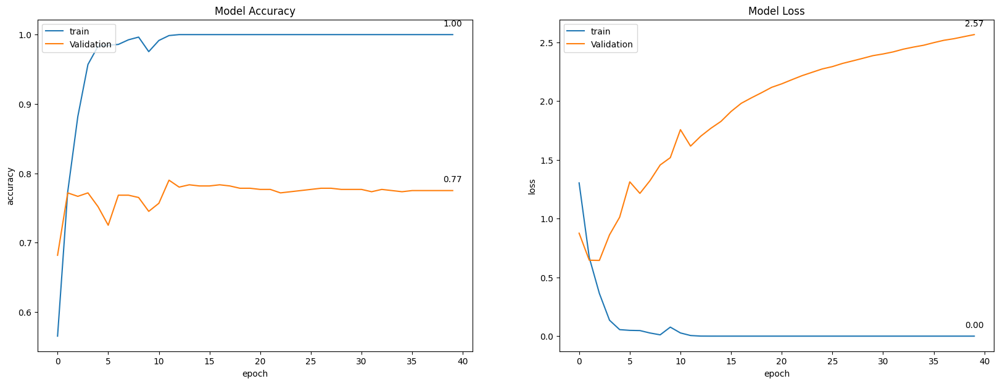

In [0]:
base_model_adam = create_model(len(CLASS_NAMES))
build_model(base_model_adam, model_optimizer= tf.keras.optimizers.Adam(learning_rate=0.001))
tf_callback, save_callback = add_callback(dir_name='base_model_adam', log="base_model_adam")
base_model_adam.summary()
train_data_gen.reset();
valid_data_gen.reset();
Hist = train_model(train_data_gen, valid_data_gen, base_model_adam, NUM_OF_EPOCHS, BATCH_SIZE, tf_callback, save_callback)
visualize(Hist,NUM_OF_EPOCHS)

save_model(n_classes=len(CLASS_NAMES),chk_pt_name="/content/base_model_adam/model_1.ckpt",model_optimizer= tf.keras.optimizers.Adam(learning_rate=0.001),name="base_model_adam")

### RMSprop

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_20 (Conv2D)           (None, 224, 224, 32)      896       
_________________________________________________________________
conv2d_21 (Conv2D)           (None, 224, 224, 32)      9248      
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 112, 112, 32)      0         
_________________________________________________________________
conv2d_22 (Conv2D)           (None, 112, 112, 64)      18496     
_________________________________________________________________
conv2d_23 (Conv2D)           (None, 112, 112, 64)      36928     
_________________________________________________________________
max_pooling2d_11 (MaxPooling (None, 56, 56, 64)        0         
_________________________________________________________________
flatten_5 (Flatten)          (None, 200704)           

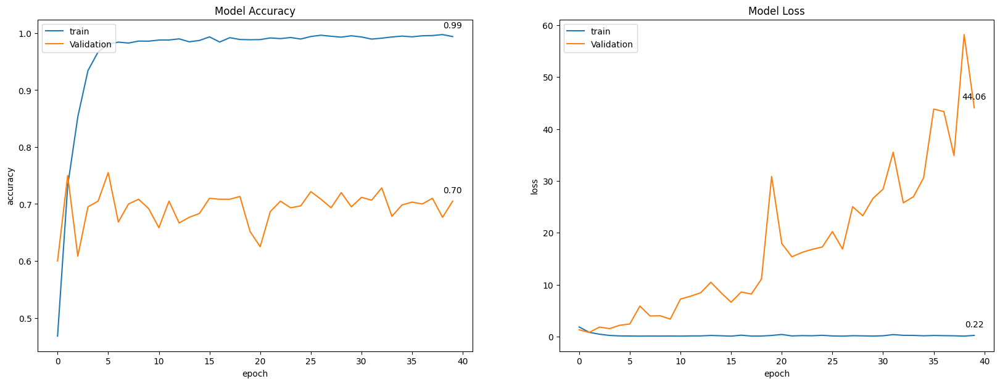

In [0]:
base_model_rms = create_model(len(CLASS_NAMES))
build_model(base_model_rms, model_optimizer=tf.keras.optimizers.RMSprop(learning_rate=0.001))
tf_callback, save_callback = add_callback(dir_name='base_model_rms', log="base_model_rms")
base_model_rms.summary()
train_data_gen.reset();
valid_data_gen.reset();
Hist = train_model(train_data_gen, valid_data_gen, base_model_rms, NUM_OF_EPOCHS, BATCH_SIZE, tf_callback, save_callback)
visualize(Hist,NUM_OF_EPOCHS)
save_model(n_classes=len(CLASS_NAMES),chk_pt_name="/content/base_model_rms/model_1.ckpt",model_optimizer= tf.keras.optimizers.RMSprop(learning_rate=0.001),name="base_model_rms")

### SGD

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_28 (Conv2D)           (None, 224, 224, 32)      896       
_________________________________________________________________
conv2d_29 (Conv2D)           (None, 224, 224, 32)      9248      
_________________________________________________________________
max_pooling2d_14 (MaxPooling (None, 112, 112, 32)      0         
_________________________________________________________________
conv2d_30 (Conv2D)           (None, 112, 112, 64)      18496     
_________________________________________________________________
conv2d_31 (Conv2D)           (None, 112, 112, 64)      36928     
_________________________________________________________________
max_pooling2d_15 (MaxPooling (None, 56, 56, 64)        0         
_________________________________________________________________
flatten_7 (Flatten)          (None, 200704)           

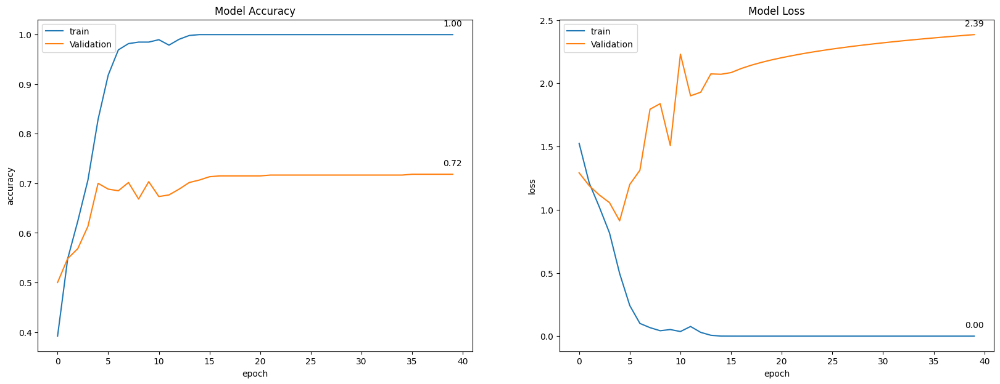

In [0]:
base_model_SGD = create_model(len(CLASS_NAMES))
build_model(base_model_SGD, model_optimizer=tf.keras.optimizers.SGD(momentum=0.9))
tf_callback, save_callback = add_callback(dir_name='base_model_SGD_mom', log="base_model_SGD_mom")
base_model_SGD.summary()
train_data_gen.reset();
valid_data_gen.reset();
Hist = train_model(train_data_gen, valid_data_gen, base_model_SGD, NUM_OF_EPOCHS, BATCH_SIZE, tf_callback, save_callback)
visualize(Hist,NUM_OF_EPOCHS)
save_model(n_classes=len(CLASS_NAMES),chk_pt_name="/content/base_model_SGD_mom/model_1.ckpt",model_optimizer= tf.keras.optimizers.SGD(momentum=0.9),name="base_model_SGD")

In [0]:
train_data_gen.reset();
valid_data_gen.reset();
Hist = train_model(train_data_gen, valid_data_gen, base_model, 40, BATCH_SIZE, tf_callback, save_callback)

In [0]:
visualize(Hist,40)

In [0]:
save_model(n_classes=len(CLASS_NAMES),chk_pt_name="/content/base_model_rms/model_1.ckpt",model_optimizer= tf.keras.optimizers.RMSprop(learning_rate=0.001),name="base_model_rms")


In [0]:
!cp *.h5 "/content/drive/My Drive/My_EE544/h5_Models/"

### TensorBoard


In [0]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [0]:
saving_model = create_model(len(CLASS_NAMES))
build_model(saving_model)

saving_model.load_weights('/content/base_model/model_1.ckpt')

In [0]:
loss, acc = saving_model.evaluate(valid_data_gen,steps=600/32)
print('Restored model, accuracy: {:5.2f}%'.format(100*acc))

19/18 [==============================] - 3s 184ms/step - loss: 1.0632 - accuracy: 0.7887
Restored model, accuracy: 78.87%


## Function to visualize misclassified images

In [0]:
def visualize_missClassified_images(model, data_gen, batch_size, directory):  
  f_name = data_gen.filenames
  true_labels = data_gen.labels
  data_gen.reset()
  predicted_labels = model.predict(data_gen, steps = np.ceil(len(true_labels)/batch_size))
  predicted_labels = list( np.argmax(a) for a in predicted_labels)
  incorrect_labels = list(np.array(true_labels)- np.array(predicted_labels))
  idx_incorrect = [idx for idx, val in enumerate(incorrect_labels) if val != 0] 
  incorrect_img = [f_name[i] for i in idx_incorrect]
  incorrect_lab = [predicted_labels[i] for i in idx_incorrect]
  incorrect_true_lab = [true_labels[i] for i in idx_incorrect]

  cnt_class1 = 0;
  cnt_class2 = 0;
  cnt_class3 = 0;
  cnt_class4 = 0;
  cnt_class5 = 0;
  cnt_class6 = 0;
  img_to_show=[]
  img_true_lab = []
  img_inc_lab = []
  for i in range(len(incorrect_img)):
    if (incorrect_true_lab[i] ==0 and cnt_class1 <5):
      img_to_show.append(incorrect_img[i])
      img_true_lab.append(incorrect_true_lab[i])
      img_inc_lab.append(incorrect_lab[i])
      cnt_class1+=1
    if (incorrect_true_lab[i] ==1 and cnt_class2 <5):
      img_to_show.append(incorrect_img[i])
      img_true_lab.append(incorrect_true_lab[i])
      img_inc_lab.append(incorrect_lab[i])
      cnt_class2+=1
    if (incorrect_true_lab[i] ==2 and cnt_class3 <5):
      img_to_show.append(incorrect_img[i])
      img_true_lab.append(incorrect_true_lab[i])
      img_inc_lab.append(incorrect_lab[i])
      cnt_class3+=1
    if (incorrect_true_lab[i] ==3 and cnt_class4 <5):
      img_to_show.append(incorrect_img[i])
      img_true_lab.append(incorrect_true_lab[i])
      img_inc_lab.append(incorrect_lab[i])
      cnt_class4+=1
    if (incorrect_true_lab[i] ==4 and cnt_class5 <5):
      img_to_show.append(incorrect_img[i])
      img_true_lab.append(incorrect_true_lab[i])
      img_inc_lab.append(incorrect_lab[i])
      cnt_class5+=1
    if (incorrect_true_lab[i] ==5 and cnt_class6 <5):
      img_to_show.append(incorrect_img[i])
      img_true_lab.append(incorrect_true_lab[i])
      img_inc_lab.append(incorrect_lab[i])
      cnt_class5+=1

  fig=plt.figure(figsize=(10,10))
  columns = 5
  rows = 6
  for i in range(1, columns*rows +1):
      img = plt.imread(directory+img_to_show[i-1])
      fig.add_subplot(rows, columns, i)
      plt.title("T: "+str(img_true_lab[i-1]) + " P:" +str(img_inc_lab[i-1]))
      plt.axis('off')
      plt.imshow(img)
      
  plt.show()




## Testing Base MOdels



### Loading all the saved base models

In [0]:
save_model = create_model(len(CLASS_NAMES));
build_model(save_model, model_optimizer=tf.keras.optimizers.Adam(learning_rate=0.001));
save_model.load_weights("/content/base_model_adam/model_1.ckpt");

In [0]:
new_model_adam = tf.keras.models.load_model('/content/my_model_base_model_adam.h5')
new_model_SGD= tf.keras.models.load_model('/content/my_model_base_model_SGD.h5')
new_model_rms = tf.keras.models.load_model('/content/my_model_base_model_rms.h5')


### Misclassified BY ADAM

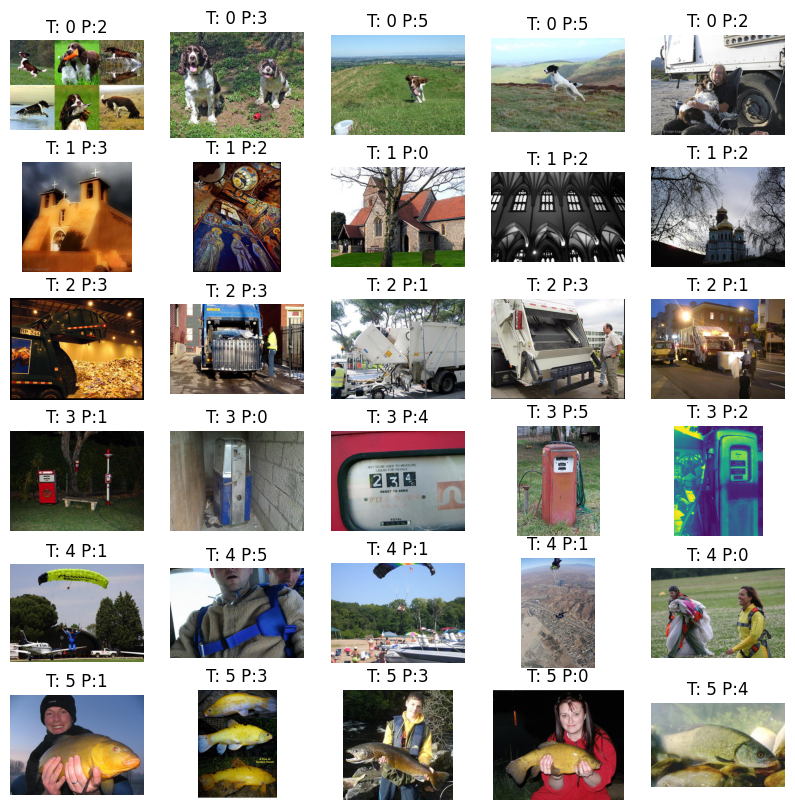

In [0]:
visualize_missClassified_images(new_model_adam, valid_data_gen, BATCH_SIZE,directory="/content/validation/" )

### Classification Report on Validation Set

In [0]:
valid_data_gen.reset()
print("Classifcation Report using ADAM on Validation set:")
print_classification_report(new_model_adam, valid_data_gen, BATCH_SIZE)
valid_data_gen.reset()
print("Classifcation Report using RMSProp on Validation set:")
print_classification_report(new_model_rms, valid_data_gen, BATCH_SIZE)
valid_data_gen.reset()
print("Classifcation Report using SGD on Validation set:")
print_classification_report(new_model_SGD, valid_data_gen, BATCH_SIZE)

Classifcation Report using ADAM on Validation set:
              precision    recall  f1-score   support

           0       0.84      0.81      0.83       100
           1       0.77      0.77      0.77       100
           2       0.68      0.77      0.72       100
           3       0.72      0.62      0.67       100
           4       0.90      0.86      0.88       100
           5       0.83      0.91      0.87       100

    accuracy                           0.79       600
   macro avg       0.79      0.79      0.79       600
weighted avg       0.79      0.79      0.79       600

Confusion Matrix:
  [[81  1  6  4  2  6]
 [ 3 77  9  6  3  2]
 [ 2  6 77 10  0  5]
 [ 3  9 19 62  3  4]
 [ 4  6  1  2 86  1]
 [ 3  1  1  2  2 91]]
Classifcation Report using RMSProp on Validation set:
              precision    recall  f1-score   support

           0       0.87      0.68      0.76       100
           1       0.73      0.68      0.70       100
           2       0.62      0.75      0.6

### Classification Report on Test Set

In [0]:
test_data_gen.reset()
print("Classifcation Report using ADAM on Test set:")
print_classification_report(new_model_adam, test_data_gen, BATCH_SIZE)
test_data_gen.reset()
print("Classifcation Report using RMSProp on Test set:")
print_classification_report(new_model_rms, test_data_gen, BATCH_SIZE)
test_data_gen.reset()
print("Classifcation Report using SGD on Test set:")
print_classification_report(new_model_SGD, test_data_gen, BATCH_SIZE)

Classifcation Report using ADAM on Test set:
              precision    recall  f1-score   support

           0       0.84      0.86      0.85        50
           1       0.76      0.68      0.72        50
           2       0.65      0.86      0.74        50
           3       0.78      0.50      0.61        50
           4       0.84      0.86      0.85        50
           5       0.78      0.86      0.82        50

    accuracy                           0.77       300
   macro avg       0.78      0.77      0.76       300
weighted avg       0.78      0.77      0.76       300

Confusion Matrix:
  [[43  0  2  0  2  3]
 [ 2 34  4  3  3  4]
 [ 1  2 43  2  0  2]
 [ 0  6 14 25  2  3]
 [ 0  3  2  2 43  0]
 [ 5  0  1  0  1 43]]
Classifcation Report using RMSProp on Test set:
              precision    recall  f1-score   support

           0       0.92      0.70      0.80        50
           1       0.72      0.58      0.64        50
           2       0.64      0.82      0.72        50


## Adding Dropout

In [0]:
NUM_OF_EPOCHS = 40

In [0]:
def save_custom_model(model,chk_pt_name,name=''):
  model.load_weights(chk_pt_name);
  #loss, acc = save_model.evaluate(valid_data_gen, steps=steps);
  save_model.save('my_model_'+name +'.h5')
  return save_model;


### Using STD Dropout

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_32 (Conv2D)           (None, 224, 224, 32)      896       
_________________________________________________________________
conv2d_33 (Conv2D)           (None, 224, 224, 32)      9248      
_________________________________________________________________
dropout_17 (Dropout)         (None, 224, 224, 32)      0         
_________________________________________________________________
max_pooling2d_16 (MaxPooling (None, 112, 112, 32)      0         
_________________________________________________________________
conv2d_34 (Conv2D)           (None, 112, 112, 64)      18496     
_________________________________________________________________
conv2d_35 (Conv2D)           (None, 112, 112, 64)      36928     
_________________________________________________________________
dropout_18 (Dropout)         (None, 112, 112, 64)     

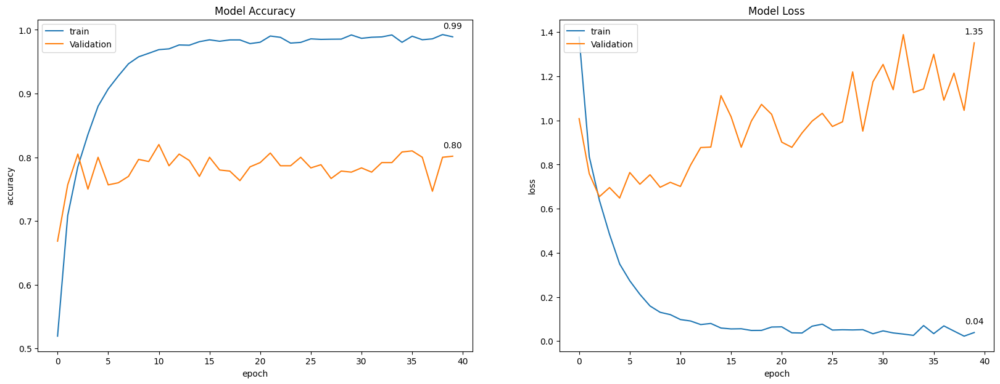

In [0]:
model_with_dropout = create_model(len(CLASS_NAMES),positions=[2,5,7,8], layers=[tf.keras.layers.Dropout(0.2),
                                                               tf.keras.layers.Dropout(0.2),
                                                               tf.keras.layers.Dropout(0.5),
                                                              tf.keras.layers.Dropout(0.5)])
'''model_with_dropout = create_model(len(CLASS_NAMES),positions=[7], layers=[
                                                               tf.keras.layers.Dropout(0.5)])'''

build_model(model_with_dropout, model_optimizer=tf.keras.optimizers.Adam(learning_rate=0.001))
tf_callbck_dropout, save_callbck_dropout = add_callback(dir_name='model_with_dropout', log="model_with_dropout")
model_with_dropout.summary()
save_model = model_with_dropout;
train_data_gen.reset();
valid_data_gen.reset();
t0 = time.time()
Hist = train_model(train_data_gen, valid_data_gen, model_with_dropout, NUM_OF_EPOCHS, BATCH_SIZE, tf_callbck_dropout, save_callbck_dropout)
t_end = time.time();
print("Training took: ", t_end-t0, "sec")
visualize(Hist,NUM_OF_EPOCHS)
save_custom_model(save_model,chk_pt_name="/content/model_with_dropout/model_1.ckpt",name="model_with_dropout")

### Using Spatial2D dropout

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_36 (Conv2D)           (None, 224, 224, 32)      896       
_________________________________________________________________
conv2d_37 (Conv2D)           (None, 224, 224, 32)      9248      
_________________________________________________________________
spatial_dropout2d_4 (Spatial (None, 224, 224, 32)      0         
_________________________________________________________________
max_pooling2d_18 (MaxPooling (None, 112, 112, 32)      0         
_________________________________________________________________
conv2d_38 (Conv2D)           (None, 112, 112, 64)      18496     
_________________________________________________________________
conv2d_39 (Conv2D)           (None, 112, 112, 64)      36928     
_________________________________________________________________
spatial_dropout2d_5 (Spatial (None, 112, 112, 64)     

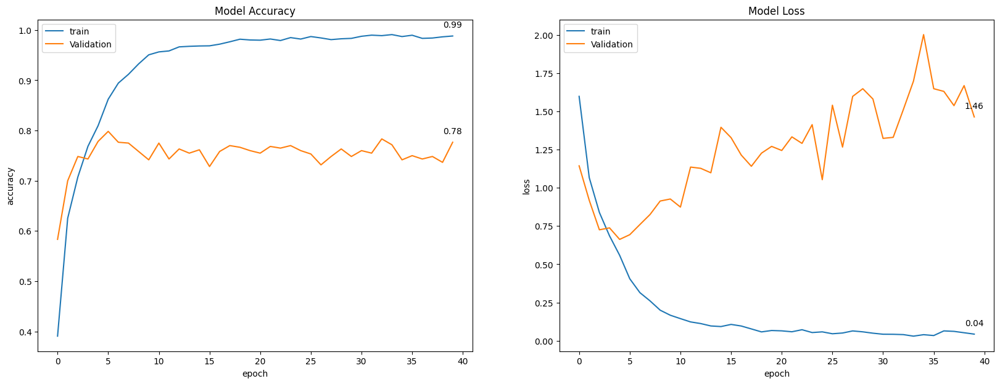

In [0]:
model_with_dropout = create_model(len(CLASS_NAMES),positions=[2,5,7,8], layers=[tf.keras.layers.SpatialDropout2D(0.2),
                                                               tf.keras.layers.SpatialDropout2D(0.2),
                                                               tf.keras.layers.Dropout(0.5),
                                                              tf.keras.layers.Dropout(0.5)])
'''model_with_dropout = create_model(len(CLASS_NAMES),positions=[7], layers=[
                                                               tf.keras.layers.Dropout(0.5)])'''

build_model(model_with_dropout, model_optimizer=tf.keras.optimizers.Adam(learning_rate=0.001))
tf_callbck_dropout, save_callbck_dropout = add_callback(dir_name='model_with_Spatialdropout', log="model_with_Spatialdropout")
model_with_dropout.summary()
save_model = model_with_dropout;
train_data_gen.reset();
valid_data_gen.reset();
t0 = time.time()
Hist = train_model(train_data_gen, valid_data_gen, model_with_dropout, NUM_OF_EPOCHS, BATCH_SIZE, tf_callbck_dropout, save_callbck_dropout)
t_end = time.time();
print("Training took: ", t_end-t0, "sec")
visualize(Hist,NUM_OF_EPOCHS)
save_custom_model(save_model,chk_pt_name="/content/model_with_Spatialdropout/model_1.ckpt",name="model_with_Spatialdropout")

### Testing Model with Dropout only

#### Loading Models

In [0]:
model_dropout = tf.keras.models.load_model('/content/my_model_model_with_dropout.h5')
model_SpatialDropout= tf.keras.models.load_model('/content/my_model_model_with_Spatialdropout.h5')


#### Classification Report on Validation set

In [0]:
valid_data_gen.reset()
print("Classifcation Report using Dropout on Validation set:")
print_classification_report(model_dropout, valid_data_gen, BATCH_SIZE)
valid_data_gen.reset()
print("Classifcation Report using Spatial2D Dropout on Validation set:")
print_classification_report(model_SpatialDropout, valid_data_gen, BATCH_SIZE)

Classifcation Report using Dropout on Validation set:
              precision    recall  f1-score   support

           0       0.86      0.89      0.87       100
           1       0.71      0.79      0.75       100
           2       0.74      0.74      0.74       100
           3       0.80      0.74      0.77       100
           4       0.89      0.86      0.87       100
           5       0.95      0.90      0.92       100

    accuracy                           0.82       600
   macro avg       0.82      0.82      0.82       600
weighted avg       0.82      0.82      0.82       600

Confusion Matrix:
  [[89  1  5  2  1  2]
 [ 2 79  7  7  5  0]
 [ 5  9 74  9  1  2]
 [ 0 13 11 74  1  1]
 [ 4  7  2  1 86  0]
 [ 4  2  1  0  3 90]]
Classifcation Report using Spatial2D Dropout on Validation set:
              precision    recall  f1-score   support

           0       0.78      0.87      0.82       100
           1       0.72      0.80      0.76       100
           2       0.82      

#### Classification report on test set

In [0]:
test_data_gen.reset()
print("Classifcation Report using Dropout on Test set:")
print_classification_report(model_dropout, test_data_gen, BATCH_SIZE)
test_data_gen.reset()
print("Classifcation Report using Spatial2D Dropout on Test set:")
print_classification_report(model_SpatialDropout, test_data_gen, BATCH_SIZE)

Classifcation Report using Dropout on Test set:
              precision    recall  f1-score   support

           0       0.83      0.88      0.85        50
           1       0.77      0.74      0.76        50
           2       0.76      0.74      0.75        50
           3       0.82      0.72      0.77        50
           4       0.91      0.98      0.94        50
           5       0.85      0.88      0.86        50

    accuracy                           0.82       300
   macro avg       0.82      0.82      0.82       300
weighted avg       0.82      0.82      0.82       300

Confusion Matrix:
  [[44  0  2  2  0  2]
 [ 1 37  2  3  3  4]
 [ 2  6 37  3  1  1]
 [ 1  3  8 36  1  1]
 [ 0  1  0  0 49  0]
 [ 5  1  0  0  0 44]]
Classifcation Report using Spatial2D Dropout on Test set:
              precision    recall  f1-score   support

           0       0.80      0.88      0.84        50
           1       0.78      0.76      0.77        50
           2       0.82      0.74      0.

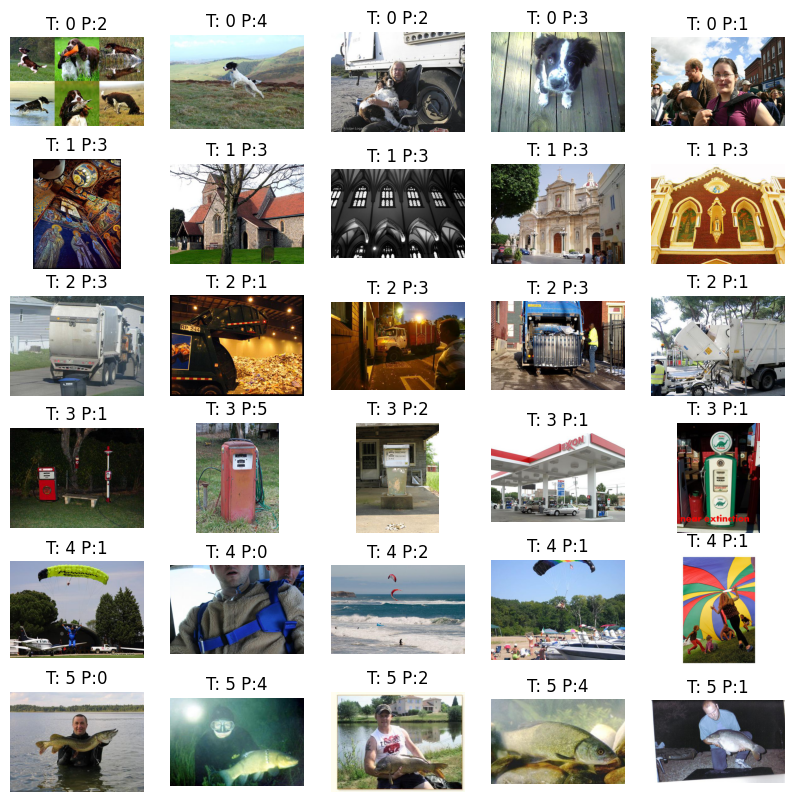

In [0]:
visualize_missClassified_images(model_dropout, valid_data_gen, BATCH_SIZE,directory="/content/validation/" )

## Data Augmentation

#### Different Data Geneator 

In [0]:
NUM_OF_EPOCHS = 40

In [0]:
#image_generator_with_augmentation = tf.keras.preprocessing.image.ImageDataGenerator(rotation_range=20,horizontal_flip=True,brightness_range=(0,0.5),rescale=1./255)
image_generator_with_augmentation = tf.keras.preprocessing.image.ImageDataGenerator(rotation_range=20,
                                                                                    horizontal_flip=True,
                                                                                    width_shift_range=0.1,
                                                                                    height_shift_range = 0.1,
                                                                                    shear_range = 0.2,
                                                                                    zoom_range = 0.2,
                                                                                    rescale=1./255)

train_data_gen_with_augmentation = image_generator_with_augmentation.flow_from_directory(directory=train_dir,
                                                                       batch_size=BATCH_SIZE,
                                                                       shuffle=True,
                                                                       target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                                       seed=1)


Found 7200 images belonging to 6 classes.


### Training With the Data generator implementing Data Augmentation

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 224, 224, 32)      896       
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 224, 224, 32)      9248      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 112, 112, 32)      0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 112, 112, 64)      18496     
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 112, 112, 64)      36928     
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 56, 56, 64)        0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 200704)           

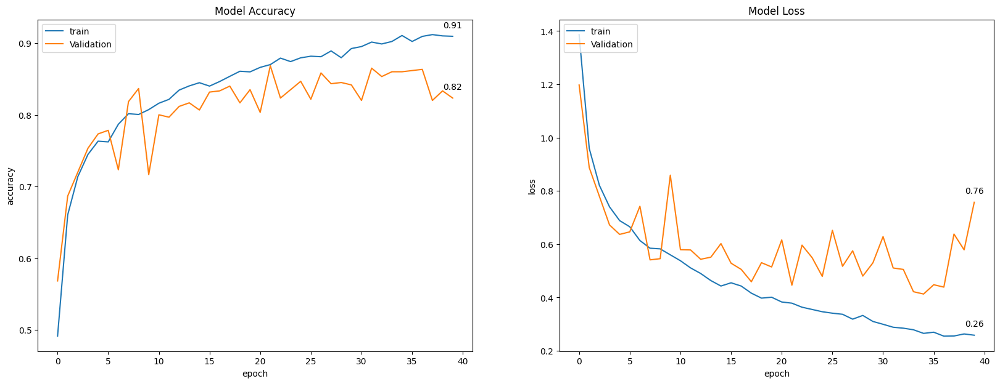

In [0]:
model_with_augmentation = create_model(len(CLASS_NAMES))
build_model(model_with_augmentation, model_optimizer = tf.keras.optimizers.Adam())
tf_callback_with_augmentation, save_callback_with_augmentation = add_callback(dir_name='model_with_augmentation', log='model_with_augmentation')
model_with_augmentation.summary()
save_model = model_with_augmentation;
train_data_gen_with_augmentation.reset();
valid_data_gen.reset();
t0 = time.time()
Hist = train_model(train_data_gen_with_augmentation, valid_data_gen, model_with_augmentation, NUM_OF_EPOCHS, BATCH_SIZE, tf_callback_with_augmentation, save_callback_with_augmentation)
t_end = time.time();
print("Training took: ", t_end-t0, "sec")
visualize(Hist,NUM_OF_EPOCHS)
save_custom_model(save_model,chk_pt_name="/content/model_with_augmentation/model_1.ckpt",name="model_with_augmentation")

In [0]:
!cp "/content/drive/My Drive/My_EE544/h5_Models/my_model_model_with_augmentation.h5" /content/

### Testing Data Augmentation

#### Loading Saved model

In [0]:
model_aug= tf.keras.models.load_model('/content/my_model_model_with_augmentation.h5')

#### Classification report of Model with Data Augmentation

In [0]:
valid_data_gen.reset()
print("Classifcation Report using Data Augmentation on Validation set:")
print_classification_report(model_aug, valid_data_gen, BATCH_SIZE)
test_data_gen.reset()
print("Classifcation Report using Data Augmentation on Test set:")
print_classification_report(model_aug, test_data_gen, BATCH_SIZE)

Classifcation Report using Data Augmentation on Validation set:
              precision    recall  f1-score   support

           0       0.93      0.90      0.91       100
           1       0.75      0.94      0.83       100
           2       0.85      0.84      0.84       100
           3       0.84      0.73      0.78       100
           4       0.92      0.88      0.90       100
           5       0.97      0.92      0.94       100

    accuracy                           0.87       600
   macro avg       0.87      0.87      0.87       600
weighted avg       0.87      0.87      0.87       600

Confusion Matrix:
  [[90  4  1  1  2  2]
 [ 0 94  1  3  2  0]
 [ 0  9 84  6  0  1]
 [ 2 11 11 73  3  0]
 [ 4  4  2  2 88  0]
 [ 1  4  0  2  1 92]]
Classifcation Report using Data Augmentation on Test set:
              precision    recall  f1-score   support

           0       0.89      0.94      0.91        50
           1       0.84      0.86      0.85        50
           2       0.89  

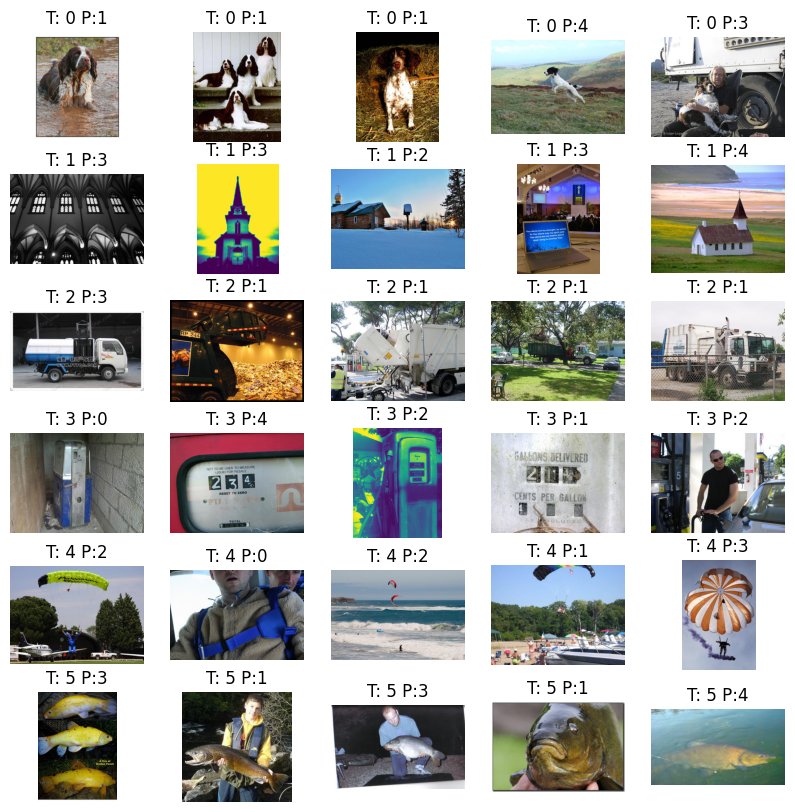

In [0]:
valid_data_gen.reset();
visualize_missClassified_images(model_aug, valid_data_gen, BATCH_SIZE,directory="/content/validation/" )

##Adding batch nomalization

### BN after activation

In [0]:
NUM_OF_EPOCHS=40

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 224, 224, 32)      896       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 224, 224, 32)      9248      
_________________________________________________________________
batch_normalization (BatchNo (None, 224, 224, 32)      128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 112, 112, 32)      0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 112, 112, 64)      18496     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 112, 112, 64)      36928     
_________________________________________________________________
batch_normalization_1 (Batch (None, 112, 112, 64)      2

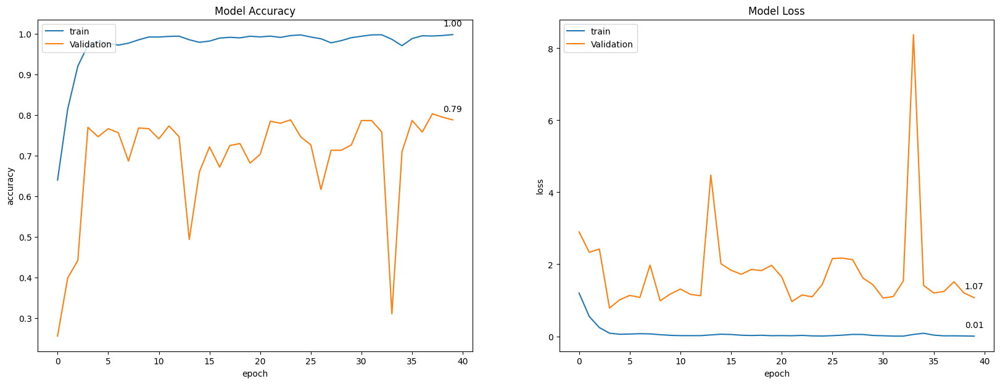

In [0]:
model_norm = create_model(len(CLASS_NAMES), positions=[2,5,7,8], layers=[tf.keras.layers.BatchNormalization(),
                                                                       tf.keras.layers.BatchNormalization(),
                                                                       tf.keras.layers.BatchNormalization(),
                                                                       tf.keras.layers.BatchNormalization()])
build_model(model_norm, model_optimizer=tf.keras.optimizers.Adam())
tf_callbck_norm, save_callbck_norm = add_callback(dir_name='model_with_norm',log="model_with_norm")
model_norm.summary()
save_model = model_norm;
train_data_gen.reset();
valid_data_gen.reset();
t0 = time.time()
Hist = train_model(train_data_gen, valid_data_gen, model_norm, NUM_OF_EPOCHS, BATCH_SIZE, tf_callbck_norm, save_callbck_norm)
t_end = time.time();
print("Training took: ", t_end-t0, "sec")
visualize(Hist,NUM_OF_EPOCHS)
save_custom_model(save_model,chk_pt_name="/content/model_with_norm/model_1.ckpt",name="model_with_norm")

### Testing BN after Activation

#### Loading the saved model

In [0]:
model_norm_t= tf.keras.models.load_model('/content/my_model_model_with_norm.h5')

In [0]:
model_norm_t= tf.keras.models.load_model('/content/drive/My Drive/my_model_model_with_norm.h5')

#### Classification Report of BN after activation

In [0]:
valid_data_gen.reset()
print("Classifcation Report using BN on Validation set:")
print_classification_report(model_norm_t, valid_data_gen, BATCH_SIZE)
test_data_gen.reset()
print("Classifcation Report using BN on Test set:")
print_classification_report(model_norm_t, test_data_gen, BATCH_SIZE)

Classifcation Report using BN on Validation set:
              precision    recall  f1-score   support

           0       0.79      0.84      0.82       100
           1       0.80      0.74      0.77       100
           2       0.75      0.80      0.78       100
           3       0.81      0.71      0.76       100
           4       0.92      0.79      0.85       100
           5       0.77      0.94      0.85       100

    accuracy                           0.80       600
   macro avg       0.81      0.80      0.80       600
weighted avg       0.81      0.80      0.80       600

Confusion Matrix:
  [[84  2  2  0  0 12]
 [ 6 74  8  8  3  1]
 [ 3  1 80  8  1  7]
 [ 5  6 12 71  1  5]
 [ 5  9  3  1 79  3]
 [ 3  0  1  0  2 94]]
Classifcation Report using BN on Test set:
              precision    recall  f1-score   support

           0       0.84      0.82      0.83        50
           1       0.80      0.64      0.71        50
           2       0.73      0.86      0.79        50
 

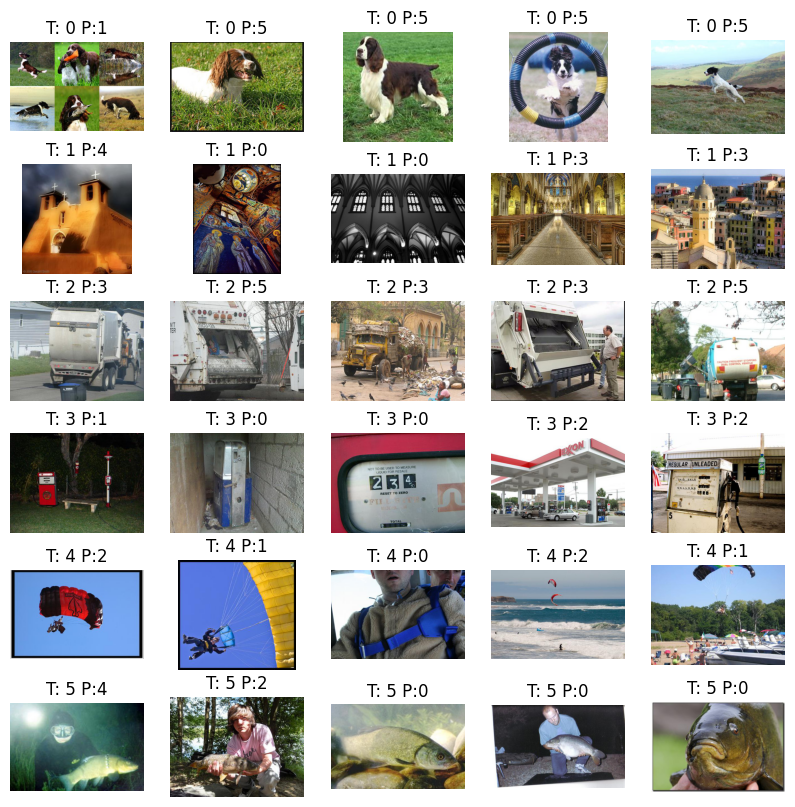

In [0]:
valid_data_gen.reset();
visualize_missClassified_images(model_norm_t, valid_data_gen, BATCH_SIZE,directory="/content/validation/" )

### Batch norm 2

In [0]:
NUM_OF_EPOCHS = 40

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 224, 224, 32)      896       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 224, 224, 32)      9248      
_________________________________________________________________
batch_normalization (BatchNo (None, 224, 224, 32)      128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 112, 112, 32)      0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 112, 112, 64)      18496     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 112, 112, 64)      36928     
_________________________________________________________________
batch_normalization_1 (Batch (None, 112, 112, 64)      2

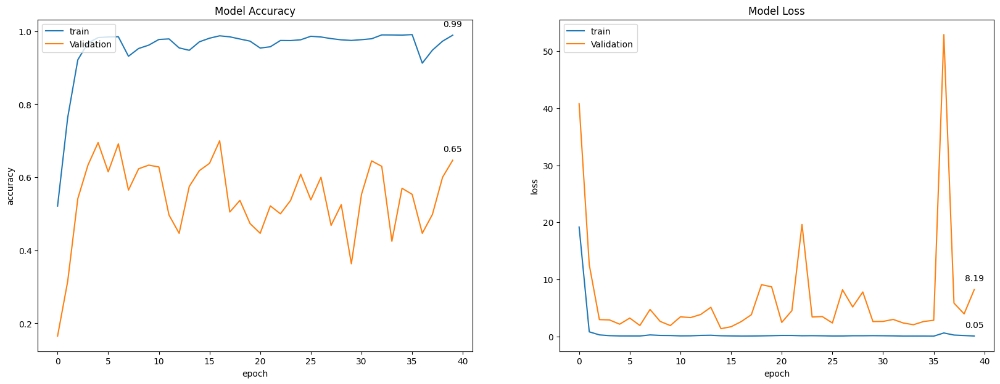

In [0]:
model_norm_2 = create_model(len(CLASS_NAMES), positions=[2,5,7], layers=[tf.keras.layers.BatchNormalization(),
                                                                       tf.keras.layers.BatchNormalization(),
                                                                       tf.keras.layers.BatchNormalization()])
build_model(model_norm_2, model_optimizer=tf.keras.optimizers.Adam())
tf_callbck_norm, save_callbck_norm = add_callback(dir_name='model_with_norm_2',log="model_with_norm_2")
model_norm_2.summary()
save_model = model_norm_2;
train_data_gen.reset();
valid_data_gen.reset();
t0 = time.time()
Hist = train_model(train_data_gen, valid_data_gen, model_norm_2, NUM_OF_EPOCHS, BATCH_SIZE, tf_callbck_norm, save_callbck_norm)
t_end = time.time();
print("Training took: ", t_end-t0, "sec")
visualize(Hist,NUM_OF_EPOCHS)
save_custom_model(save_model,chk_pt_name="/content/model_with_norm_2/model_1.ckpt",name="model_with_norm_2")

ERROR! Session/line number was not unique in database. History logging moved to new session 59
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 224, 224, 32)      896       
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 224, 224, 32)      9248      
_________________________________________________________________
batch_normalization_3 (Batch (None, 224, 224, 32)      128       
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 112, 112, 32)      0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 112, 112, 64)      18496     
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 112, 112, 64)      36928     
_________________________

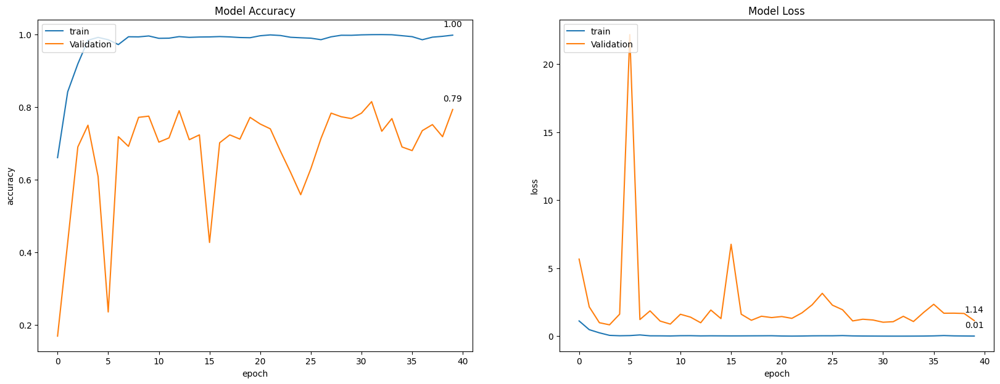

In [0]:
model_norm_3 = create_model(len(CLASS_NAMES), positions=[2,5,8], layers=[tf.keras.layers.BatchNormalization(),
                                                                       tf.keras.layers.BatchNormalization(),
                                                                       tf.keras.layers.BatchNormalization()])
build_model(model_norm_3, model_optimizer=tf.keras.optimizers.Adam())
tf_callbck_norm, save_callbck_norm = add_callback(dir_name='model_with_norm_3',log="model_with_norm_3")
model_norm_3.summary()
save_model = model_norm_3;
train_data_gen.reset();
valid_data_gen.reset();
t0 = time.time()
Hist = train_model(train_data_gen, valid_data_gen, model_norm_3, NUM_OF_EPOCHS, BATCH_SIZE, tf_callbck_norm, save_callbck_norm)
t_end = time.time();
print("Training took: ", t_end-t0, "sec")
visualize(Hist,NUM_OF_EPOCHS)
save_custom_model(save_model,chk_pt_name="/content/model_with_norm_3/model_1.ckpt",name="model_with_norm_3")

### Batch norm before activation

In [0]:
NUM_OF_EPOCHS = 40

Model: "sequential_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_44 (Conv2D)           (None, 224, 224, 32)      896       
_________________________________________________________________
batch_normalization_41 (Batc (None, 224, 224, 32)      128       
_________________________________________________________________
activation_40 (Activation)   (None, 224, 224, 32)      0         
_________________________________________________________________
conv2d_45 (Conv2D)           (None, 224, 224, 32)      9248      
_________________________________________________________________
batch_normalization_42 (Batc (None, 224, 224, 32)      128       
_________________________________________________________________
activation_41 (Activation)   (None, 224, 224, 32)      0         
_________________________________________________________________
max_pooling2d_22 (MaxPooling (None, 112, 112, 32)    

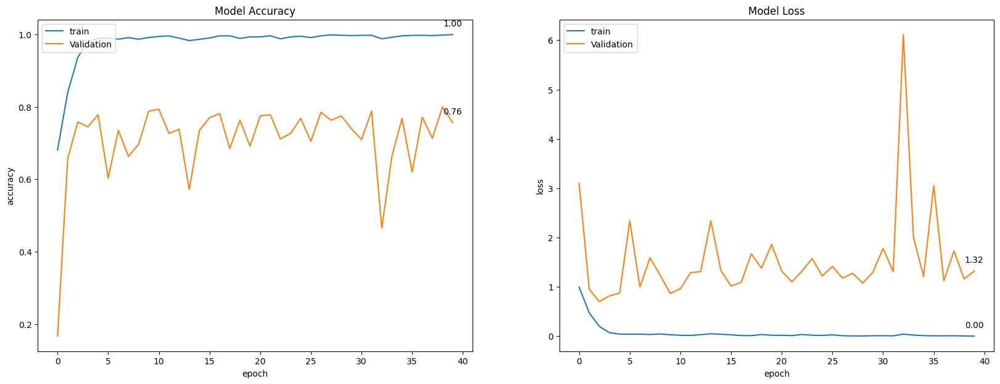

In [0]:
model_norm_before_activatn = create_model_2(len(CLASS_NAMES), positions=[1,3,6,8,12], layers=[tf.keras.layers.BatchNormalization(),
                                                                       tf.keras.layers.BatchNormalization(),
                                                                       tf.keras.layers.BatchNormalization(),
                                                                       tf.keras.layers.BatchNormalization(),
                                                                       tf.keras.layers.BatchNormalization()])
build_model(model_norm_before_activatn, model_optimizer=tf.keras.optimizers.Adam())
tf_callbck_norm_before_activatn, save_callbck_norm_before_activatn = add_callback(dir_name='model_with_norm_before_activatn',log="model_with_norm_before_activatn")
model_norm_before_activatn.summary()
save_model = model_norm_before_activatn;
train_data_gen.reset();
valid_data_gen.reset();
t0 = time.time()
Hist = train_model(train_data_gen, valid_data_gen, model_norm_before_activatn, NUM_OF_EPOCHS, BATCH_SIZE, tf_callbck_norm_before_activatn, save_callbck_norm_before_activatn)
t_end = time.time();
print("Training took: ", t_end-t0, "sec")
visualize(Hist,NUM_OF_EPOCHS)
save_custom_model(save_model,chk_pt_name="/content/model_with_norm_before_activatn/model_1.ckpt",name="model_with_norm_before_activatn")

### Testing BN before activation

#### Loading saved model

In [0]:
model_norm_bef= tf.keras.models.load_model('/content/drive/My Drive/my_model_model_with_norm_before_activatn.h5')

#### Classification Report of BN before Activation

In [0]:
valid_data_gen.reset()
print("Classifcation Report using BN before activation on Validation set:")
print_classification_report(model_norm_bef, valid_data_gen, BATCH_SIZE)
test_data_gen.reset()
print("Classifcation Report using BN before activation on Test set:")
print_classification_report(model_norm_bef, test_data_gen, BATCH_SIZE)

Classifcation Report using BN before activation on Validation set:
              precision    recall  f1-score   support

           0       0.93      0.68      0.79       100
           1       0.80      0.75      0.77       100
           2       0.75      0.79      0.77       100
           3       0.71      0.75      0.73       100
           4       0.82      0.89      0.85       100
           5       0.83      0.94      0.88       100

    accuracy                           0.80       600
   macro avg       0.81      0.80      0.80       600
weighted avg       0.81      0.80      0.80       600

Confusion Matrix:
  [[68  2 10  5  7  8]
 [ 3 75  5  9  6  2]
 [ 1  1 79 12  1  6]
 [ 0 10 11 75  3  1]
 [ 0  5  1  3 89  2]
 [ 1  1  0  1  3 94]]
Classifcation Report using BN before activation on Test set:
              precision    recall  f1-score   support

           0       0.91      0.64      0.75        50
           1       0.82      0.64      0.72        50
           2       

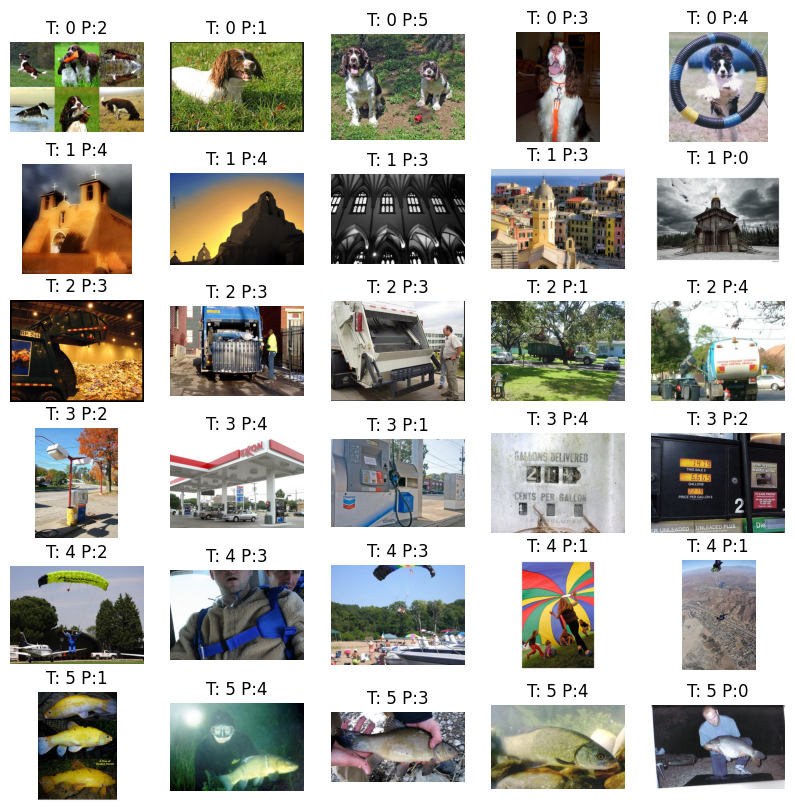

In [0]:
valid_data_gen.reset();
visualize_missClassified_images(model_norm_bef, valid_data_gen, BATCH_SIZE,directory="/content/validation/" )

#Combined model

## Final Model-1

In [0]:
NUM_OF_EPOCHS = 50

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_8 (Conv2D)            (None, 224, 224, 32)      896       
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 224, 224, 32)      9248      
_________________________________________________________________
batch_normalization_6 (Batch (None, 224, 224, 32)      128       
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 112, 112, 32)      0         
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 112, 112, 64)      18496     
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 112, 112, 64)      36928     
_________________________________________________________________
batch_normalization_7 (Batch (None, 112, 112, 64)     

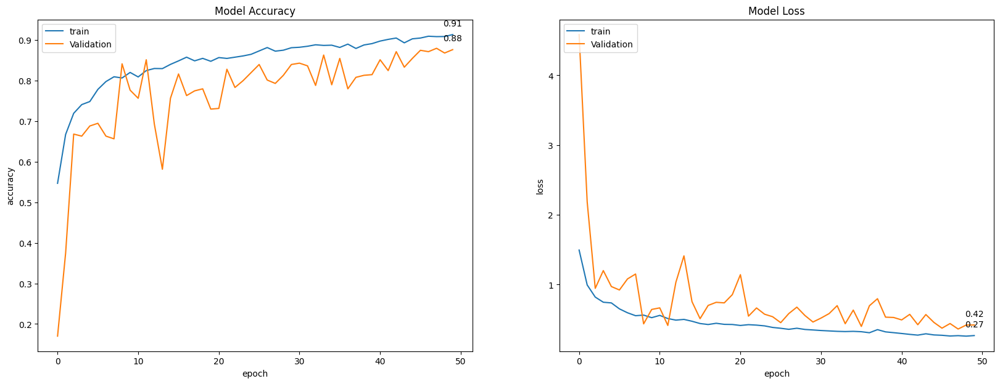

In [0]:
model_all = create_model(len(CLASS_NAMES), positions=[2,5,7,8,8], layers=[tf.keras.layers.BatchNormalization(),    
                                                                       tf.keras.layers.BatchNormalization(),
                                                                       tf.keras.layers.Dropout(0.5),
                                                                       tf.keras.layers.BatchNormalization(),
                                                                        tf.keras.layers.Dropout(0.5)])
build_model(model_all, model_optimizer=tf.keras.optimizers.Adam(learning_rate=0.001))
tf_callbck_all, save_callbck_all = add_callback(dir_name='model_with_all',log="model_with_all")
model_all.summary()
save_model = model_all;
train_data_gen_with_augmentation.reset();
valid_data_gen.reset();
t0 = time.time()
Hist = train_model(train_data_gen_with_augmentation, valid_data_gen, model_all, NUM_OF_EPOCHS, BATCH_SIZE, tf_callbck_all, save_callbck_all)
t_end = time.time();
print("Training took: ", t_end-t0, "sec")
visualize(Hist,NUM_OF_EPOCHS)
save_custom_model(save_model,chk_pt_name="/content/model_with_all/model_1.ckpt",name="model_with_all")

### Testing Combined Model-1

#### Loading Model

In [0]:
!cp "/content/drive/My Drive/My_EE544/h5_models/my_model_model_with_all.h5" /content/

In [0]:
model_final_1= tf.keras.models.load_model('/content/my_model_model_with_all.h5')

#### Classification Report

In [0]:
valid_data_gen.reset()
print("Classifcation Report for Final model-1 on Validation set:")
print_classification_report(model_final_1, valid_data_gen, BATCH_SIZE)
test_data_gen.reset()
print("Classifcation Report for Final model-1 on Test set:")
print_classification_report(model_final_1, test_data_gen, BATCH_SIZE)

Classifcation Report for Final model-1 on Validation set:
              precision    recall  f1-score   support

           0       0.95      0.88      0.91       100
           1       0.81      0.91      0.85       100
           2       0.94      0.73      0.82       100
           3       0.74      0.87      0.80       100
           4       0.95      0.92      0.93       100
           5       0.96      0.97      0.97       100

    accuracy                           0.88       600
   macro avg       0.89      0.88      0.88       600
weighted avg       0.89      0.88      0.88       600

Confusion Matrix:
  [[88  3  1  5  2  1]
 [ 1 91  1  7  0  0]
 [ 1  9 73 14  0  3]
 [ 2  5  3 87  3  0]
 [ 1  3  0  4 92  0]
 [ 0  2  0  1  0 97]]
Classifcation Report for Final model-1 on Test set:
              precision    recall  f1-score   support

           0       0.98      0.96      0.97        50
           1       0.84      0.84      0.84        50
           2       1.00      0.86    

IndexError: ignored

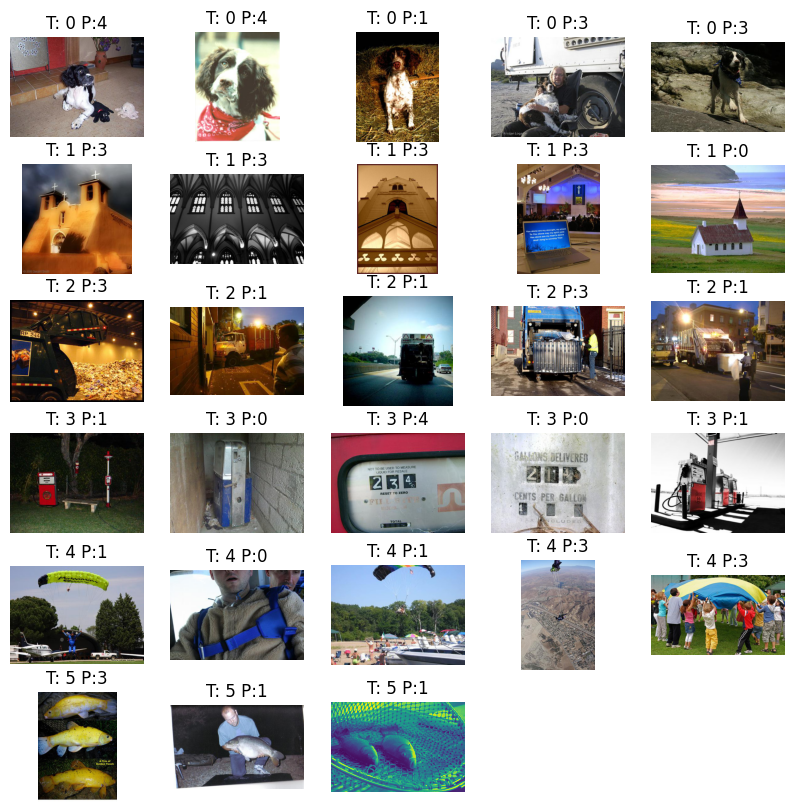

In [0]:
valid_data_gen.reset();
visualize_missClassified_images(model_final_1, valid_data_gen, BATCH_SIZE,directory="/content/validation/" )

### Failed moddification to final model -1

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 224, 224, 32)      896       
_________________________________________________________________
batch_normalization_5 (Batch (None, 224, 224, 32)      128       
_________________________________________________________________
activation_5 (Activation)    (None, 224, 224, 32)      0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 224, 224, 32)      9248      
_________________________________________________________________
batch_normalization_6 (Batch (None, 224, 224, 32)      128       
_________________________________________________________________
activation_6 (Activation)    (None, 224, 224, 32)      0         
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 112, 112, 32)     

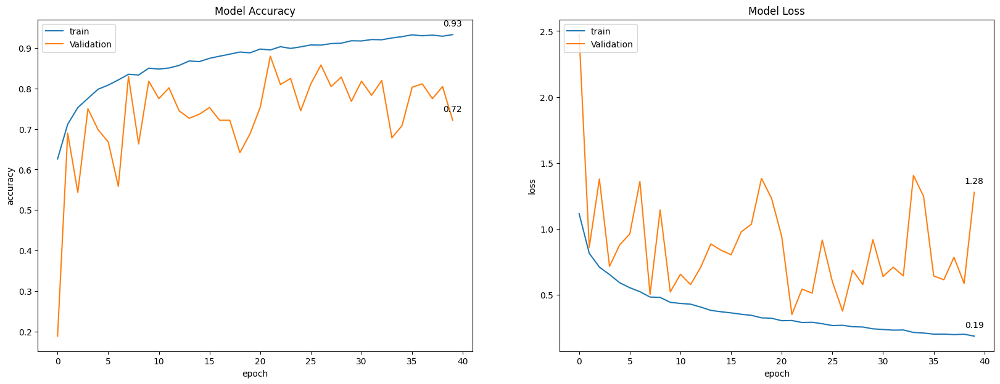

ValueError: ignored

In [0]:
model_all_DO = create_model_2(len(CLASS_NAMES), positions=[1,3,6,8,11,12], layers=[tf.keras.layers.BatchNormalization(),    
                                                                       tf.keras.layers.BatchNormalization(),
                                                                       tf.keras.layers.BatchNormalization(),
                                                                       tf.keras.layers.BatchNormalization(),
                                                                       tf.keras.layers.Dropout(0.5),
                                                                       tf.keras.layers.BatchNormalization()])
build_model(model_all_DO, model_optimizer=tf.keras.optimizers.Adam(learning_rate=0.001))
tf_callbck_all_DO, save_callbck_all_DO = add_callback(dir_name='model_with_all_no_DO',log="model_with_all_no_DO")
model_all_DO.summary()
save_model = model_all_DO;
train_data_gen_with_augmentation.reset();
valid_data_gen.reset();
t0 = time.time()
Hist = train_model(train_data_gen_with_augmentation, valid_data_gen, model_all_DO, NUM_OF_EPOCHS, BATCH_SIZE, tf_callbck_all_DO, save_callbck_all_DO)
t_end = time.time();
print("Training took: ", t_end-t0, "sec")
visualize(Hist,NUM_OF_EPOCHS)
save_custom_model(save_model,chk_pt_name="/content/model_with_all_DO/model_1.ckpt",name="model_with_all_DO")

## Combined model with no DO and BN after activations

In [0]:
NUM_OF_EPOCHS = 30

In [0]:
model_all_BN_A = create_model(len(CLASS_NAMES), positions=[2,5,8], layers=[tf.keras.layers.BatchNormalization(),    
                                                                       tf.keras.layers.BatchNormalization(),
                                                                       tf.keras.layers.BatchNormalization(),
                                                                        ])
build_model(model_all_BN_A, model_optimizer=tf.keras.optimizers.SGD(momentum=0.9))
tf_callbck_all, save_callbck_all = add_callback(dir_name='model_all_BN_A',log="model_all_BN_A")
model_all_BN_A.summary()
save_model = model_all_BN_A;
train_data_gen_with_augmentation.reset();
valid_data_gen.reset();
t0 = time.time()
Hist = train_model(train_data_gen_with_augmentation, valid_data_gen, model_all_BN_A, NUM_OF_EPOCHS, BATCH_SIZE, tf_callbck_all, save_callbck_all)
t_end = time.time();
print("Training took: ", t_end-t0, "sec")
visualize(Hist,NUM_OF_EPOCHS)
save_custom_model(save_model,chk_pt_name="/content/model_all_BN_A/model_1.ckpt",name="model_all_BN_A")

## Final Model -2

In [0]:
NUM_OF_EPOCHS = 60

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 224, 224, 32)      896       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 224, 224, 32)      9248      
_________________________________________________________________
batch_normalization (BatchNo (None, 224, 224, 32)      128       
_________________________________________________________________
spatial_dropout2d (SpatialDr (None, 224, 224, 32)      0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 112, 112, 32)      0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 112, 112, 64)      18496     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 112, 112, 64)      3

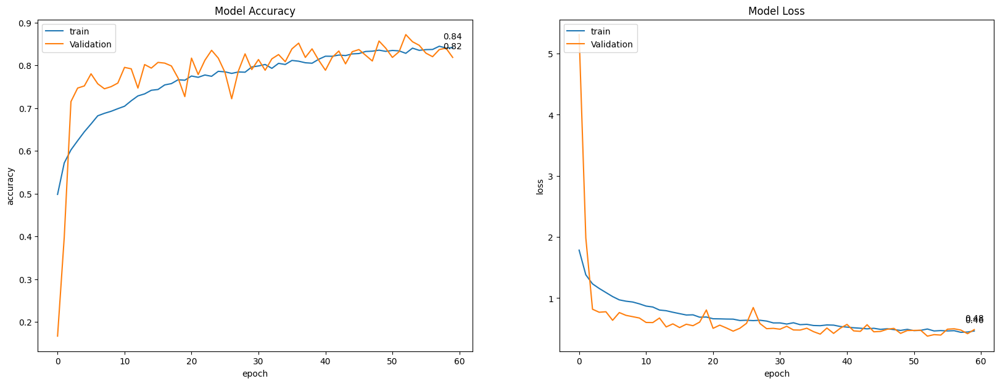

In [0]:
model_all_BN_DO = create_model(len(CLASS_NAMES), positions=[2,2,5,5,7,8,8], layers=[tf.keras.layers.BatchNormalization(),  
                                                                              tf.keras.layers.SpatialDropout2D(0.2),  
                                                                       tf.keras.layers.BatchNormalization(),
                                                                       tf.keras.layers.SpatialDropout2D(0.2),
                                                                       tf.keras.layers.Dropout(0.5),
                                                                       tf.keras.layers.BatchNormalization(),
                                                                       tf.keras.layers.Dropout(0.5),
                                                                        ])
build_model(model_all_BN_DO, model_optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001))
tf_callbck_all, save_callbck_all = add_callback(dir_name='model_all_BN_DO',log="model_all_BN_DO")
model_all_BN_DO.summary()
save_model = model_all_BN_DO;
train_data_gen_with_augmentation.reset();
valid_data_gen.reset();
t0 = time.time()
Hist = train_model(train_data_gen_with_augmentation, valid_data_gen, model_all_BN_DO, NUM_OF_EPOCHS, BATCH_SIZE, tf_callbck_all, save_callbck_all)
t_end = time.time();
print("Training took: ", t_end-t0, "sec")
visualize(Hist,NUM_OF_EPOCHS)

#### Saving with ckpt files to h5 format 

In [0]:
model_all_BN_DO = create_model(len(CLASS_NAMES), positions=[2,2,5,5,7,8,8], layers=[tf.keras.layers.BatchNormalization(),  
                                                                              tf.keras.layers.SpatialDropout2D(0.2),  
                                                                       tf.keras.layers.BatchNormalization(),
                                                                       tf.keras.layers.SpatialDropout2D(0.2),
                                                                       tf.keras.layers.Dropout(0.5),
                                                                       tf.keras.layers.BatchNormalization(),
                                                                       tf.keras.layers.Dropout(0.5),
                                                                        ])
build_model(model_all_BN_DO, model_optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001))
tf_callbck_all, save_callbck_all = add_callback(dir_name='model_all_BN_DO',log="model_all_BN_DO")
model_all_BN_DO.summary()
save_model = model_all_BN_DO;
save_custom_model( save_model, "/content/model_all_BN_DO/model_1.ckpt", name="model_all_BN_DO" )

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 224, 224, 32)      896       
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 224, 224, 32)      9248      
_________________________________________________________________
batch_normalization_3 (Batch (None, 224, 224, 32)      128       
_________________________________________________________________
spatial_dropout2d_2 (Spatial (None, 224, 224, 32)      0         
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 112, 112, 32)      0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 112, 112, 64)      18496     
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 112, 112, 64)     

####Testing slower model:

In [0]:
!cp -r "/content/drive/My Drive/My_EE544/model_all_BN_DO" /content/


In [0]:
model_final_2_sl= tf.keras.models.load_model('/content/my_model_model_all_BN_DO.h5')

In [0]:
valid_data_gen.reset()
print("Classifcation Report for Final model-2 (Slower version) on Validation set:")
print_classification_report(model_final_2_sl, valid_data_gen, BATCH_SIZE)
test_data_gen.reset()
print("Classifcation Report for Final model-2 (Slower version) on Test set:")
print_classification_report(model_final_2_sl, test_data_gen, BATCH_SIZE)

Classifcation Report for Final model-2 (Slower version) on Validation set:
              precision    recall  f1-score   support

           0       0.98      0.87      0.92       100
           1       0.75      0.90      0.82       100
           2       0.87      0.79      0.83       100
           3       0.87      0.81      0.84       100
           4       0.88      0.90      0.89       100
           5       0.91      0.96      0.94       100

    accuracy                           0.87       600
   macro avg       0.88      0.87      0.87       600
weighted avg       0.88      0.87      0.87       600

Confusion Matrix:
  [[87  2  3  1  4  3]
 [ 0 90  1  3  5  1]
 [ 0 13 79  4  1  3]
 [ 0  8  8 81  2  1]
 [ 1  6  0  2 90  1]
 [ 1  1  0  2  0 96]]
Classifcation Report for Final model-2 (Slower version) on Test set:
              precision    recall  f1-score   support

           0       0.93      0.82      0.87        50
           1       0.82      0.80      0.81        50
   

IndexError: ignored

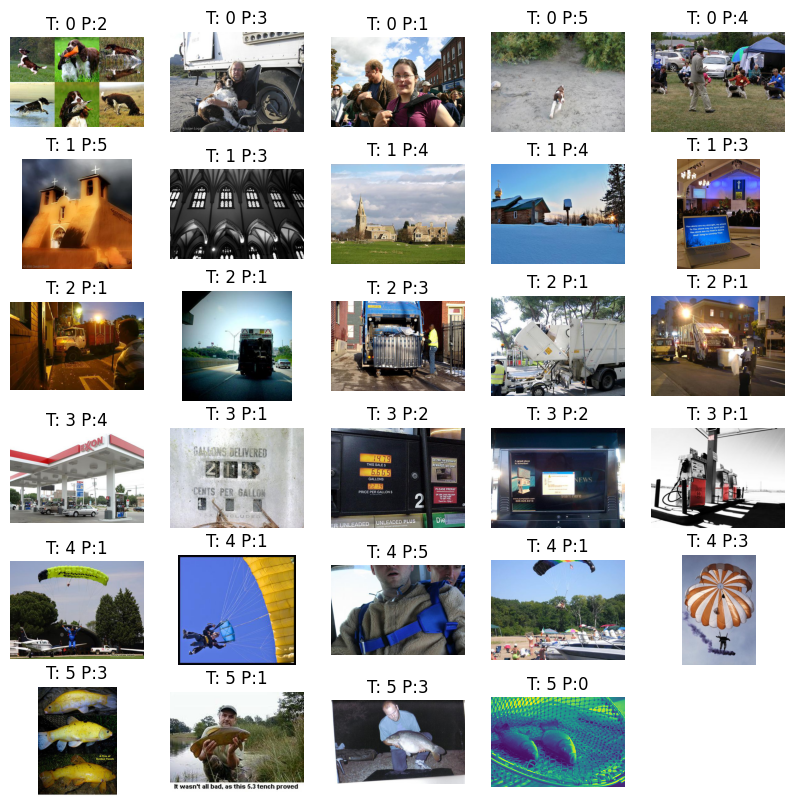

In [0]:
valid_data_gen.reset();
visualize_missClassified_images(model_final_2_sl, valid_data_gen, BATCH_SIZE,directory="/content/validation/" )

### Increasing learning rate

In [0]:
NUM_OF_EPOCHS = 50

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 224, 224, 32)      896       
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 224, 224, 32)      9248      
_________________________________________________________________
batch_normalization_3 (Batch (None, 224, 224, 32)      128       
_________________________________________________________________
spatial_dropout2d_2 (Spatial (None, 224, 224, 32)      0         
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 112, 112, 32)      0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 112, 112, 64)      18496     
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 112, 112, 64)     

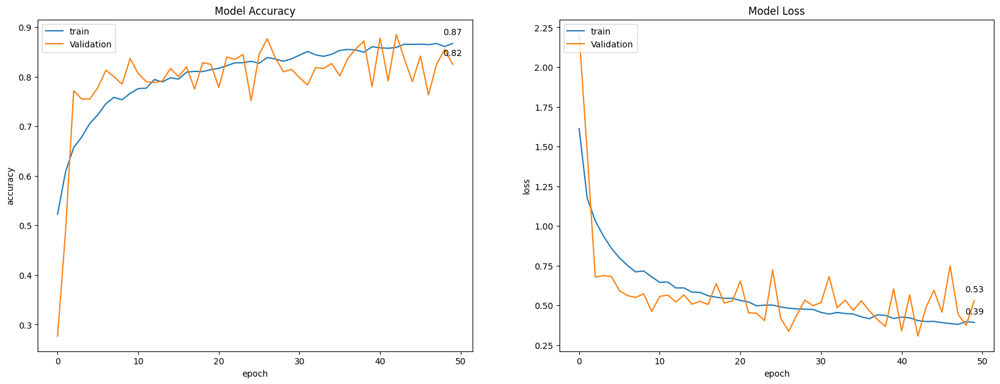

In [0]:
model_all_BN_DO_m1 = create_model(len(CLASS_NAMES), positions=[2,2,5,5,7,8,8], layers=[tf.keras.layers.BatchNormalization(),  
                                                                              tf.keras.layers.SpatialDropout2D(0.2),  
                                                                       tf.keras.layers.BatchNormalization(),
                                                                       tf.keras.layers.SpatialDropout2D(0.2),
                                                                       tf.keras.layers.Dropout(0.5),
                                                                       tf.keras.layers.BatchNormalization(),
                                                                       tf.keras.layers.Dropout(0.5),
                                                                        ])
build_model(model_all_BN_DO_m1, model_optimizer=tf.keras.optimizers.Adam(learning_rate=5*0.0001))
tf_callbck_all, save_callbck_all = add_callback(dir_name='model_all_BN_DO_m1',log="model_all_BN_DO_m1")
model_all_BN_DO_m1.summary()
save_model = model_all_BN_DO_m1;
train_data_gen_with_augmentation.reset();
valid_data_gen.reset();
t0 = time.time()
Hist = train_model(train_data_gen_with_augmentation, valid_data_gen, model_all_BN_DO_m1, NUM_OF_EPOCHS, BATCH_SIZE, tf_callbck_all, save_callbck_all)
t_end = time.time();
print("Training took: ", t_end-t0, "sec")
visualize(Hist,NUM_OF_EPOCHS)

#### Saving the faster Model

In [0]:
!cp -r "/content/drive/My Drive/My_EE544/model_all_BN_DO_m1" /content/

In [0]:
model_all_BN_DO_m1 = create_model(len(CLASS_NAMES), positions=[2,2,5,5,7,8,8], layers=[tf.keras.layers.BatchNormalization(),  
                                                                              tf.keras.layers.SpatialDropout2D(0.2),  
                                                                       tf.keras.layers.BatchNormalization(),
                                                                       tf.keras.layers.SpatialDropout2D(0.2),
                                                                       tf.keras.layers.Dropout(0.5),
                                                                       tf.keras.layers.BatchNormalization(),
                                                                       tf.keras.layers.Dropout(0.5),
                                                                        ])
build_model(model_all_BN_DO_m1, model_optimizer=tf.keras.optimizers.Adam(learning_rate=5*0.0001))
tf_callbck_all, save_callbck_all = add_callback(dir_name='model_all_BN_DO_m1',log="model_all_BN_DO_m1")
model_all_BN_DO_m1.summary()
save_model = model_all_BN_DO_m1;
save_custom_model(save_model, "/content/model_all_BN_DO_m1/model_1.ckpt",name="model_all_BN_DO_m1")

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 224, 224, 32)      896       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 224, 224, 32)      9248      
_________________________________________________________________
batch_normalization (BatchNo (None, 224, 224, 32)      128       
_________________________________________________________________
spatial_dropout2d (SpatialDr (None, 224, 224, 32)      0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 112, 112, 32)      0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 112, 112, 64)      18496     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 112, 112, 64)      3

#### Testing faster model

In [0]:
model_final_2_fa= tf.keras.models.load_model('/content/my_model_model_all_BN_DO_m1.h5')

In [0]:
valid_data_gen.reset()
print("Classifcation Report for Final model-2 (Faster) on Validation set:")
print_classification_report(model_final_2_fa, valid_data_gen, BATCH_SIZE)
test_data_gen.reset()
print("Classifcation Report for Final model-2 (Faster) on Test set:")
print_classification_report(model_final_2_fa, test_data_gen, BATCH_SIZE)

Classifcation Report for Final model-2 (Faster) on Validation set:
              precision    recall  f1-score   support

           0       0.98      0.91      0.94       100
           1       0.77      0.92      0.84       100
           2       0.94      0.80      0.86       100
           3       0.80      0.84      0.82       100
           4       0.94      0.87      0.90       100
           5       0.93      0.97      0.95       100

    accuracy                           0.89       600
   macro avg       0.89      0.88      0.89       600
weighted avg       0.89      0.89      0.89       600

Confusion Matrix:
  [[91  1  0  3  1  4]
 [ 0 92  1  4  3  0]
 [ 0  9 80  9  0  2]
 [ 0 10  4 84  2  0]
 [ 2  6  0  4 87  1]
 [ 0  2  0  1  0 97]]
Classifcation Report for Final model-2 (Faster) on Test set:
              precision    recall  f1-score   support

           0       0.94      0.98      0.96        50
           1       0.87      0.82      0.85        50
           2       

IndexError: ignored

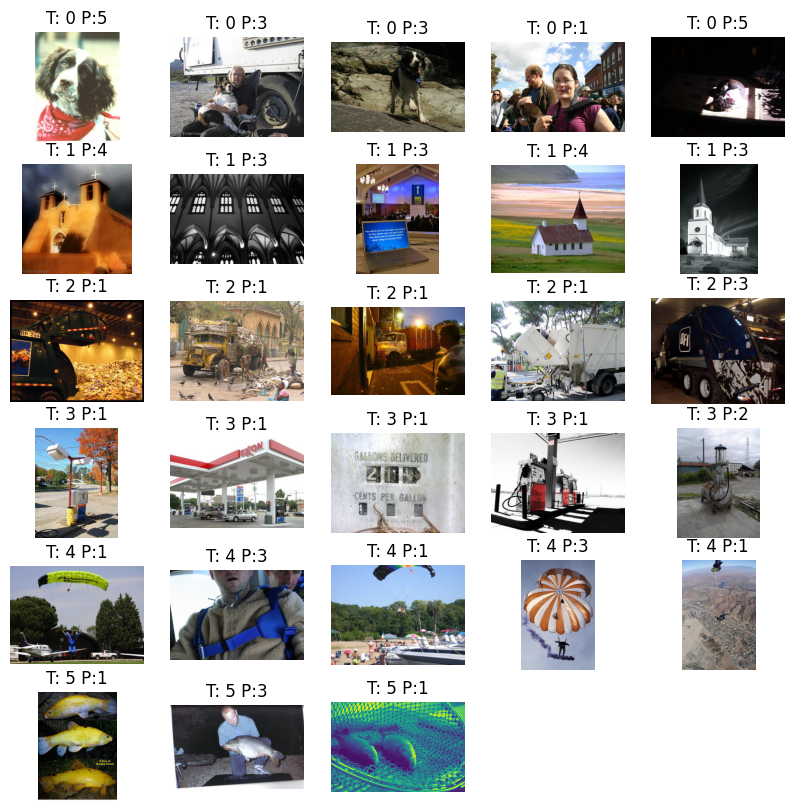

In [0]:
valid_data_gen.reset();
visualize_missClassified_images(model_final_2_fa, valid_data_gen, BATCH_SIZE,directory="/content/validation/" )

#### Same as above with SGD 

In [0]:
NUM_OF_EPOCHS = 40

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 224, 224, 32)      896       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 224, 224, 32)      9248      
_________________________________________________________________
batch_normalization (BatchNo (None, 224, 224, 32)      128       
_________________________________________________________________
spatial_dropout2d (SpatialDr (None, 224, 224, 32)      0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 112, 112, 32)      0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 112, 112, 64)      18496     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 112, 112, 64)      3

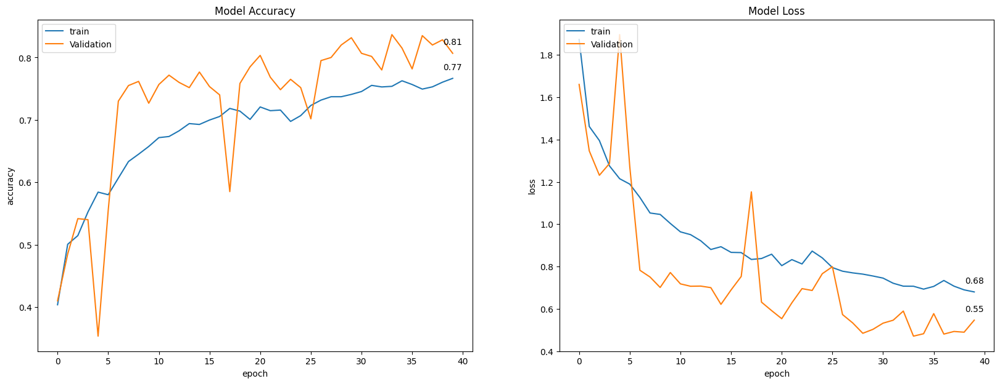

In [0]:
model_all_BN_DO_SGD = create_model(len(CLASS_NAMES), positions=[2,2,5,5,7,8,8], layers=[tf.keras.layers.BatchNormalization(),  
                                                                              tf.keras.layers.SpatialDropout2D(0.2),  
                                                                       tf.keras.layers.BatchNormalization(),
                                                                       tf.keras.layers.SpatialDropout2D(0.2),
                                                                       tf.keras.layers.Dropout(0.5),
                                                                       tf.keras.layers.BatchNormalization(),
                                                                       tf.keras.layers.Dropout(0.5),
                                                                        ])
build_model(model_all_BN_DO_SGD, model_optimizer=tf.keras.optimizers.SGD(learning_rate = 5*0.001, momentum=0.9))
tf_callbck_all, save_callbck_all = add_callback(dir_name='model_all_BN_DO_SGD',log="model_all_BN_DO_SGD")
model_all_BN_DO_SGD.summary()
save_model = model_all_BN_DO_SGD;
train_data_gen_with_augmentation.reset();
valid_data_gen.reset();
t0 = time.time()
Hist = train_model(train_data_gen_with_augmentation, valid_data_gen, model_all_BN_DO_SGD, NUM_OF_EPOCHS, BATCH_SIZE, tf_callbck_all, save_callbck_all)
t_end = time.time();
print("Training took: ", t_end-t0, "sec")
visualize(Hist,NUM_OF_EPOCHS)

###### Continuing learning 

In [0]:
NUM_OF_EPOCHS = 10

In [0]:
model_all_BN_DO_SGD = create_model(len(CLASS_NAMES), positions=[2,2,5,5,7,8,8], layers=[tf.keras.layers.BatchNormalization(),  
                                                                              tf.keras.layers.SpatialDropout2D(0.2),  
                                                                       tf.keras.layers.BatchNormalization(),
                                                                       tf.keras.layers.SpatialDropout2D(0.2),
                                                                       tf.keras.layers.Dropout(0.5),
                                                                       tf.keras.layers.BatchNormalization(),
                                                                       tf.keras.layers.Dropout(0.5),
                                                                        ])
build_model(model_all_BN_DO_SGD, model_optimizer=tf.keras.optimizers.SGD(learning_rate = 5*0.001, momentum=0.9))
tf_callbck_all, save_callbck_all = add_callback(dir_name='model_all_BN_DO_SGD',log="model_all_BN_DO_SGD")
model_all_BN_DO_SGD.summary()

model_all_BN_DO_SGD.load_weights('/content/drive/My Drive/My_EE544/model_all_BN_DO_SGD/model_1.ckpt')

#model_all_BN_DO_SGD.evaluate(valid_data_gen,steps=600/32)


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 224, 224, 32)      896       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 224, 224, 32)      9248      
_________________________________________________________________
batch_normalization (BatchNo (None, 224, 224, 32)      128       
_________________________________________________________________
spatial_dropout2d (SpatialDr (None, 224, 224, 32)      0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 112, 112, 32)      0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 112, 112, 64)      18496     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 112, 112, 64)      3

[0.4707985520362854, 0.8366666436195374]